### Характеристика дата сета

In [329]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import RobustScaler
from sklearn.svm import LinearSVR
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.base import clone
from sklearn.ensemble import RandomForestRegressor
import tensorflow as tf
from tensorflow import keras
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from yellowbrick.regressor import ResidualsPlot
from sklearn.neighbors import KNeighborsRegressor
import joblib
from joblib import dump, load
from sklearn.metrics import r2_score

In [3]:
df1 = pd.read_excel('/home/iana/Desktop/Data scientice/ВКР/X_bp.xlsx')

In [4]:
df2 = pd.read_excel('/home/iana/Desktop/Data scientice/ВКР/X_nup.xlsx')

In [5]:
df1_na = df1.dropna()
df1_na

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...,...
1018,1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [6]:
df2_na = df2.dropna()
df2_na

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.000000,57.000000
1,1,0,4.000000,60.000000
2,2,0,4.000000,70.000000
3,3,0,5.000000,47.000000
4,4,0,5.000000,57.000000
...,...,...,...,...
1035,1035,90,8.088111,47.759177
1036,1036,90,7.619138,66.931932
1037,1037,90,9.800926,72.858286
1038,1038,90,10.079859,65.519479


In [7]:
df = pd.merge(df1, df2, left_index=True, right_index=True, how = 'inner')
df

,Unnamed: 0_x,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Unnamed: 0_y,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,0,4.000000,57.000000
1,1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,1,0,4.000000,60.000000
2,2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,2,0,4.000000,70.000000
3,3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,3,0,5.000000,47.000000
4,4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,4,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1018,90,9.076380,47.019770
1019,1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1019,90,10.565614,53.750790
1020,1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1020,90,4.161154,67.629684
1021,1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1021,90,6.313201,58.261074


In [8]:
df.columns

Index(['Unnamed: 0_x', 'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Unnamed: 0_y', 'Угол нашивки, град', 'Шаг нашивки',
       'Плотность нашивки'],
      dtype='object')

In [9]:
df.describe()

,Unnamed: 0_x,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Unnamed: 0_y,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,511.000000,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,511.000000,44.252199,6.899222,57.153929
std,295.458965,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,295.458965,45.015793,2.563467,12.350969
min,0.000000,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000,0.000000
25%,255.500000,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,255.500000,0.000000,5.080033,49.799212
50%,511.000000,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,511.000000,0.000000,6.916144,57.341920
75%,766.500000,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,766.500000,90.000000,8.586293,64.944961
max,1022.000000,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1022.000000,90.000000,14.440522,103.988901


In [10]:
df.dtypes

Unnamed: 0_x                              int64
Соотношение матрица-наполнитель         float64
Плотность, кг/м3                        float64
модуль упругости, ГПа                   float64
Количество отвердителя, м.%             float64
Содержание эпоксидных групп,%_2         float64
Температура вспышки, С_2                float64
Поверхностная плотность, г/м2           float64
Модуль упругости при растяжении, ГПа    float64
Прочность при растяжении, МПа           float64
Потребление смолы, г/м2                 float64
Unnamed: 0_y                              int64
Угол нашивки, град                        int64
Шаг нашивки                             float64
Плотность нашивки                       float64
dtype: object

In [11]:
df = df.drop(['Unnamed: 0_y','Unnamed: 0_x'],axis = 1)
df.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,90,6.078902,77.434468


In [13]:
import pandas_profiling

In [14]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

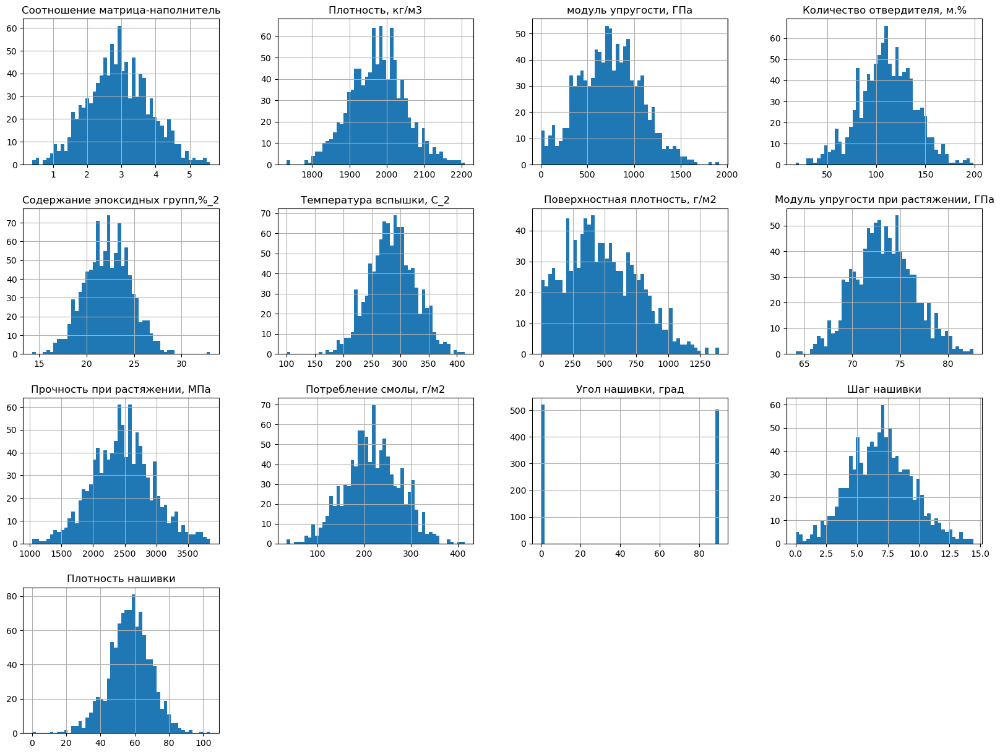

In [16]:
df.hist(bins=50, figsize = (20,15))
plt.show()

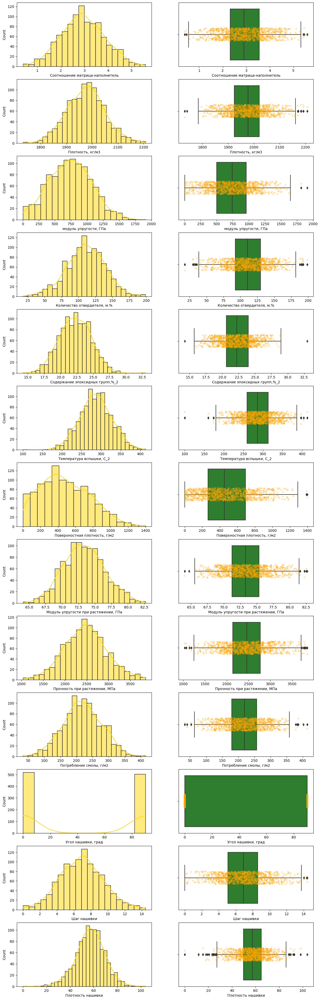

In [17]:
fig, axes = plt.subplots(13,2, figsize = (15,50))
for i, column in enumerate(df.columns):
    sns.histplot (data = df, x = column, kde = True, ax = axes [i,0], color ='gold')
    sns.boxplot(data = df, x = column, ax = axes [i,1], color = 'forestgreen')  
    sns.stripplot(x=column, data=df, ax = axes [i,1],marker="o", alpha=0.3, color="orange")
plt.show()


In [18]:
base_test=0
base_test_f=0

In [19]:
for i, column in enumerate(df.columns):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    IQR = q3-q1
    base_test = df[((df[column]<(q1-1.5*IQR))|(df[column]>(q3+1.5*IQR)))]
    if i==0: base_test_f=base_test
    if i!=0:base_test_f = pd.concat([base_test_f, base_test],  axis=0)

In [20]:
base_test_f

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
237,5.591742,2121.579070,923.668248,121.713099,21.809294,289.772089,134.349865,74.192008,2203.674811,290.173270,0,7.181458,30.882695
284,5.425139,2003.272119,524.810110,138.291706,20.793664,370.823575,267.576436,68.492114,1837.316535,226.136105,0,4.185605,31.218450
378,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0,7.317168,33.326279
505,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0,1.280057,50.323463
673,0.389403,1917.699889,602.093245,93.346585,24.966084,218.303388,325.199965,71.693413,2453.290387,284.389049,90,8.160306,58.039018
...,...,...,...,...,...,...,...,...,...,...,...,...,...
465,2.870544,2087.293217,257.935595,80.430240,23.476372,205.286821,500.887933,73.015274,2759.752788,230.792998,0,5.897057,88.807647
466,2.408626,1926.563761,637.884690,53.753338,18.399305,275.890335,263.449280,77.662035,1973.734897,304.246115,0,5.988357,24.860511
481,2.926824,1883.306258,1197.280772,97.575685,22.020977,348.134494,315.667923,69.775824,2403.843424,127.854649,0,6.604875,24.283523
496,2.966839,1849.281282,1267.641202,93.619944,27.047601,275.989489,493.624551,70.286940,2294.627295,202.784931,0,6.639577,26.559894


In [21]:
base_test_f[base_test_f.duplicated()]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
378,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0,7.317168,33.326279
505,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0,1.280057,50.323463
100,3.565855,2207.773481,696.149163,94.187613,23.562885,291.803991,384.629393,68.784473,2596.685251,402.163809,0,4.512825,46.775469
503,1.367585,2088.013591,923.421474,192.705385,23.119301,251.997689,59.939393,77.627654,2149.657181,33.803026,0,8.815040,52.134210
800,3.109085,1847.077400,826.699855,188.049898,24.336103,277.894427,694.083948,71.758106,1494.253452,386.903431,90,6.412291,60.878525


In [23]:
#Соотношение матрица-наполнитель
q1_1 = df['Соотношение матрица-наполнитель'].quantile(0.25)
q3_1 = df['Соотношение матрица-наполнитель'].quantile(0.75)
IQR_1 = q3_1-q1_1
base_1 = df[((df['Соотношение матрица-наполнитель']<(q1_1-1.5*IQR_1))|(df['Соотношение матрица-наполнитель']>(q3_1+1.5*IQR_1)))]
base_1


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
237,5.591742,2121.579070,923.668248,121.713099,21.809294,289.772089,134.349865,74.192008,2203.674811,290.173270,0,7.181458,30.882695
284,5.425139,2003.272119,524.810110,138.291706,20.793664,370.823575,267.576436,68.492114,1837.316535,226.136105,0,4.185605,31.218450
378,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0,7.317168,33.326279
505,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0,1.280057,50.323463
673,0.389403,1917.699889,602.093245,93.346585,24.966084,218.303388,325.199965,71.693413,2453.290387,284.389049,90,8.160306,58.039018
877,5.455566,2099.973071,1249.672556,108.676613,20.171757,223.516610,467.645148,66.657495,2317.268743,219.733228,90,8.595968,47.823710


In [24]:
#Плотность, кг/м3
q1_2 = df['Плотность, кг/м3'].quantile(0.25)
q3_2 = df['Плотность, кг/м3'].quantile(0.75)
IQR_2 = q3_2-q1_2
base_2 = df[((df['Плотность, кг/м3']<(q1_2-1.5*IQR_2))|(df['Плотность, кг/м3']>(q3_2+1.5*IQR_2)))]
base_2


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
100,3.565855,2207.773481,696.149163,94.187613,23.562885,291.803991,384.629393,68.784473,2596.685251,402.163809,0,4.512825,46.775469
224,1.534731,2182.751822,400.855580,118.766917,24.168973,326.049476,556.740492,78.474257,1773.569546,285.111003,0,5.801833,73.541409
251,3.759259,2172.246796,97.236317,112.401839,25.605815,281.467572,391.677214,72.838256,2599.779668,237.007233,0,9.392177,46.008294
264,2.894531,2192.297637,898.658996,127.049451,24.493248,328.174535,260.899791,74.385740,1822.735858,249.479288,0,2.841129,76.390449
317,2.930757,2184.493200,933.368211,117.801565,23.794065,255.019718,493.908897,72.268947,2617.869224,191.079776,0,8.182531,53.264181
499,1.813906,2170.342363,909.682529,89.333827,18.825181,270.810351,95.648447,71.933723,3047.474139,238.096456,0,1.626690,51.829634
626,2.245217,2192.738783,611.766338,108.265862,18.056093,339.313586,391.638637,69.687309,2832.268227,117.178874,90,7.955614,75.918566
873,4.484135,1740.657496,984.287951,61.105569,22.552746,310.232466,98.935192,74.824993,2127.387762,243.620389,90,7.094243,71.525700
918,1.651444,1731.764635,664.058923,103.299034,22.625733,314.863696,731.002551,71.915252,2368.576114,208.293492,90,11.495478,58.843197


In [25]:
q1_3 = df['модуль упругости, ГПа'].quantile(0.25)
q3_3 = df['модуль упругости, ГПа'].quantile(0.75)
IQR_3 = q3_3-q1_3
base_3 = df[((df['модуль упругости, ГПа']<(q1_3-1.5*IQR_3))|(df['модуль упругости, ГПа']>(q3_3+1.5*IQR_3)))]
base_3


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
592,1.487419,1949.031040,1911.536477,98.380762,19.447283,379.172951,426.917622,75.573334,2814.321842,256.522741,90,8.100387,54.843521
770,2.796648,2007.727318,1815.865170,117.162722,23.688583,300.914088,679.581560,79.518613,3103.000733,179.939702,90,5.108723,55.226873


In [26]:
#Количество отвердителя, м.%
q1_4 = df['Количество отвердителя, м.%'].quantile(0.25)
q3_4 = df['Количество отвердителя, м.%'].quantile(0.75)
IQR_4 = q3_4-q1_4
base_4 = df[((df['Количество отвердителя, м.%']<(q1_4-1.5*IQR_4))|(df['Количество отвердителя, м.%']>(q3_4+1.5*IQR_4)))]
base_4


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
94,1.620930,2110.566437,124.133740,191.053004,21.590295,280.120468,4.099043,72.680412,1461.448845,171.988605,0,7.388167,45.459778
208,4.706654,1938.949730,1014.173382,35.620904,24.829676,328.864659,379.246075,74.445896,3063.025225,164.547578,0,3.906225,50.741725
257,3.027269,1959.011062,916.441601,17.740275,21.965568,279.518623,508.912477,74.278829,3165.165801,245.687212,0,5.721782,71.172863
412,2.885855,1951.714931,918.042452,198.953207,26.811285,286.748810,962.345527,73.662132,1379.568514,178.357504,0,9.582822,55.278331
448,2.435946,1963.974220,741.037038,33.624187,25.259070,278.271284,792.107217,79.878657,2414.230597,196.716930,0,5.475548,62.185719
495,2.132552,2033.684615,775.055033,192.851702,20.007524,360.874137,692.366086,70.054191,1950.973300,306.093242,0,8.717044,69.800068
503,1.367585,2088.013591,923.421474,192.705385,23.119301,251.997689,59.939393,77.627654,2149.657181,33.803026,0,8.815040,52.134210
511,4.218869,2012.728817,678.842400,32.019222,22.367733,226.523009,79.518438,77.359521,1948.116573,194.988375,0,7.148868,57.676338
535,3.694056,2132.378269,1261.785969,29.956150,24.382152,302.357365,297.672136,74.515560,3575.590285,308.972215,0,4.786794,53.248529


In [27]:
#Содержание эпоксидных групп,%_2
q1_5 = df['Содержание эпоксидных групп,%_2'].quantile(0.25)
q3_5 = df['Содержание эпоксидных групп,%_2'].quantile(0.75)
IQR_5 = q3_5-q1_5
base_5 = df[((df['Содержание эпоксидных групп,%_2']<(q1_5-1.5*IQR_5))|(df['Содержание эпоксидных групп,%_2']>(q3_5+1.5*IQR_5)))]
base_5


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
298,2.385109,2129.059629,589.782966,70.760954,14.254985,302.043927,676.050552,76.472254,2529.945213,92.307158,0,4.650262,63.956692


In [28]:
#Температура вспышки, С_2
q1_6 = df['Температура вспышки, С_2'].quantile(0.25)
q3_6 = df['Температура вспышки, С_2'].quantile(0.75)
IQR_6 = q3_6-q1_6
base_6 = df[((df['Температура вспышки, С_2']<(q1_6-1.5*IQR_6))|(df['Температура вспышки, С_2']>(q3_6+1.5*IQR_6)))]
base_6


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
175,2.011042,2094.769792,1057.597455,168.911556,21.558425,396.898222,447.184425,72.694298,1548.022724,181.404491,0,3.686535,44.369484
322,2.202033,1905.172266,828.691004,67.342235,19.525485,173.484920,269.230234,71.841083,2761.667212,206.436426,0,5.113466,67.063660
378,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0,7.317168,33.326279
649,3.547512,1967.434093,741.259184,92.843804,23.553219,397.151291,438.290234,75.303394,2751.998207,196.822228,90,4.486241,52.235772
721,1.922883,2010.937896,837.613821,110.450712,22.109108,173.973907,585.310794,72.759959,2659.565599,143.805111,90,7.768986,67.045308
791,3.426368,2028.026074,453.458891,105.674852,22.415611,413.273418,586.715020,74.838137,2334.649515,233.293376,90,5.256326,46.966045
938,0.960288,1910.769529,80.081588,150.647888,26.817201,403.652861,756.286684,75.547761,2650.839969,307.937258,90,6.885764,62.784927


In [29]:
#Поверхностная плотность, г/м2
q1_7 = df['Поверхностная плотность, г/м2'].quantile(0.25)
q3_7 = df['Поверхностная плотность, г/м2'].quantile(0.75)
IQR_7 = q3_7-q1_7
base_7 = df[((df['Поверхностная плотность, г/м2']<(q1_7-1.5*IQR_7))|(df['Поверхностная плотность, г/м2']>(q3_7+1.5*IQR_7)))]
base_7


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
692,3.695486,2014.825483,667.332585,110.860146,21.797640,212.021224,1399.542362,73.194617,3583.506884,270.684615,90,8.503453,64.597786
718,3.883264,1978.962659,372.566673,94.803958,23.056813,281.289672,1391.032409,73.639983,2649.351334,288.794810,90,4.845661,50.952915


In [30]:
q1_8 = df['Модуль упругости при растяжении, ГПа'].quantile(0.25)
q3_8 = df['Модуль упругости при растяжении, ГПа'].quantile(0.75)
IQR_8 = q3_8-q1_8
base_8 = df[((df['Модуль упругости при растяжении, ГПа']<(q1_8-1.5*IQR_8))|(df['Модуль упругости при растяжении, ГПа']>(q3_8+1.5*IQR_8)))]
base_8


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
52,1.846923,1956.087297,622.722758,115.709720,21.043318,236.883672,393.395437,64.696400,2436.273659,188.274123,0,6.547993,74.218877
135,2.271032,1862.432065,1428.870308,125.557042,24.023624,317.571591,293.085220,81.594750,2419.520717,220.481828,0,0.310815,70.157259
375,2.106888,1914.089369,963.748397,58.710809,23.813708,278.612240,793.402805,82.682051,1422.975753,283.239742,0,6.776888,49.697311
505,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0,1.280057,50.323463
636,3.279825,1917.770974,439.231982,136.496126,20.435001,271.303590,569.585247,64.054061,1639.635577,220.688162,90,7.073134,52.399576
1000,3.109130,2019.939791,855.877168,125.654249,22.788022,323.766318,585.456532,82.525773,2715.953011,251.571333,90,4.212257,71.960542


In [31]:
#Прочность при растяжении, МПа
q1_9 = df['Прочность при растяжении, МПа'].quantile(0.25)
q3_9 = df['Прочность при растяжении, МПа'].quantile(0.75)
IQR_9 = q3_9-q1_9
base_9 = df[((df['Прочность при растяжении, МПа']<(q1_9-1.5*IQR_9))|(df['Прочность при растяжении, МПа']>(q3_9+1.5*IQR_9)))]
base_9


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
99,3.952834,1931.687894,348.354645,108.403571,22.951690,208.041941,97.545358,71.807955,3725.190760,134.392555,0,4.402248,48.959084
106,2.334566,2020.976475,1013.513596,109.505135,24.330905,266.258622,719.870002,68.166534,3773.151949,264.835584,0,7.363599,69.172337
172,3.441706,1839.864649,935.511792,99.079859,20.715839,330.371637,556.153263,76.632138,3791.072810,284.852950,0,7.208147,35.768811
185,2.152055,1938.282144,1065.625743,148.104233,19.093392,234.856713,865.629036,72.299462,3848.436732,143.123640,0,5.783165,36.911051
262,2.344021,2096.712613,352.789412,88.118196,24.747176,282.366448,138.865950,79.161414,1036.856605,191.863993,0,4.409139,53.895782
270,2.192099,1935.162413,1016.976050,95.568748,26.292664,302.224870,337.500700,71.761063,1071.123751,210.661195,0,12.278580,53.714943
318,3.739794,2021.454222,806.089944,70.507349,25.003381,278.597026,616.530481,75.682627,1143.210334,169.459749,0,1.262310,46.253741
387,3.578323,1988.596676,948.981345,135.707494,22.012106,221.204295,609.350655,71.801782,3817.269484,344.718381,0,6.650891,62.726164
695,3.694073,2052.863693,607.307517,109.654355,17.638147,267.369398,322.090391,71.446958,3763.445179,110.801517,90,3.656530,49.994798
719,3.655995,2057.631510,324.704859,93.800024,21.710926,306.242098,23.171395,73.933667,1145.065757,233.719536,90,11.946137,61.485847


In [32]:
#Потребление смолы, г/м2
q1_10 = df['Потребление смолы, г/м2'].quantile(0.25)
q3_10 = df['Потребление смолы, г/м2'].quantile(0.75)
IQR_10= q3_10-q1_10
base_10 = df[((df['Потребление смолы, г/м2']<(q1_10-1.5*IQR_10))|(df['Потребление смолы, г/м2']>(q3_10+1.5*IQR_10)))]
base_10


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
100,3.565855,2207.773481,696.149163,94.187613,23.562885,291.803991,384.629393,68.784473,2596.685251,402.163809,0,4.512825,46.775469
119,2.967268,2038.728453,1104.753631,137.296385,20.398797,237.000700,430.107822,69.252305,1706.261148,383.663401,0,6.232319,77.140355
211,2.696183,1959.779639,26.827000,132.031952,19.868797,349.726171,527.229431,74.659159,2188.744473,414.590628,0,12.287666,73.044781
471,3.656437,1923.649471,559.380732,109.219575,22.397008,306.957575,452.025051,72.216524,2596.398221,41.048278,0,10.081489,45.167995
503,1.367585,2088.013591,923.421474,192.705385,23.119301,251.997689,59.939393,77.627654,2149.657181,33.803026,0,8.815040,52.134210
593,3.307697,1797.648234,807.064161,120.065258,23.882251,305.439343,383.261885,68.901283,2794.677292,378.756879,90,4.519954,63.838886
787,3.564965,1997.294520,859.576828,92.401948,23.257968,342.606754,105.651727,73.043082,2071.988476,53.548916,90,4.698996,70.930592
800,3.109085,1847.077400,826.699855,188.049898,24.336103,277.894427,694.083948,71.758106,1494.253452,386.903431,90,6.412291,60.878525


In [33]:
#Шаг нашивки
q1_11 = df['Шаг нашивки'].quantile(0.25)
q3_11 = df['Шаг нашивки'].quantile(0.75)
IQR_11 = q3_11-q1_11
base_11 = df[((df['Шаг нашивки']<(q1_11-1.5*IQR_11))|(df['Шаг нашивки']>(q3_11+1.5*IQR_11)))]
base_11


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
114,3.153404,2019.552159,1063.742781,146.035949,23.695911,295.731698,822.311634,70.648753,2700.665341,194.238670,0,14.051383,74.469002
392,2.496519,2064.644261,933.835041,106.898372,22.272400,348.049052,950.685384,74.886839,2694.586007,330.728529,0,14.440522,47.713362
446,4.770073,1931.131457,516.692589,101.364383,21.538328,301.310480,168.376964,70.910513,2357.739620,198.668197,0,14.033215,52.004279
529,3.916135,1830.332164,471.506958,133.312208,19.918813,209.999731,241.219283,73.519831,2826.723248,304.184250,0,14.376451,46.452598


In [34]:
#Плотность нашивки
q1_12 = df['Плотность нашивки'].quantile(0.25)
q3_12 = df['Плотность нашивки'].quantile(0.75)
IQR_12= q3_12-q1_12
base_12 = df[((df['Плотность нашивки']<(q1_12-1.5*IQR_12))|(df['Плотность нашивки']>(q3_12+1.5*IQR_12)))]
base_12


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
19,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0,0.000000,0.000000
41,2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,66.420794,2868.586527,227.022557,0,7.401543,19.250533
74,3.126661,1985.376327,1039.385968,122.027950,22.687765,247.090686,202.395246,67.648061,1780.631386,198.685795,0,8.489060,23.898196
117,4.136691,1944.518365,589.646853,102.349135,19.580547,247.744983,371.247656,80.075363,2588.981282,346.276191,0,7.190538,92.042139
140,0.790499,2054.123810,876.794802,116.889391,23.564969,353.561943,643.647660,70.080210,2424.148613,247.193190,0,5.506840,98.202603
165,2.997574,2097.741722,1107.894781,128.597723,24.659623,262.616232,405.607114,74.569259,2049.320685,173.456799,0,5.665134,88.072490
193,2.348185,1929.677180,422.524663,104.737519,23.645353,305.799316,554.507496,76.436218,3238.218206,273.174370,0,9.992951,92.963492
233,4.371095,1976.344005,364.793754,79.244807,23.466818,270.299680,775.305859,76.270802,2259.100944,178.018403,0,12.011870,20.571633
279,4.434429,2061.918771,328.876626,81.071393,23.213218,244.874100,934.780246,76.238258,2995.952606,178.066150,0,2.788476,11.740126
309,4.643415,1945.845330,454.765954,84.666648,26.301389,288.021292,265.344838,79.096112,2590.898115,188.892470,0,9.397396,25.682856


<AxesSubplot:ylabel='Density'>

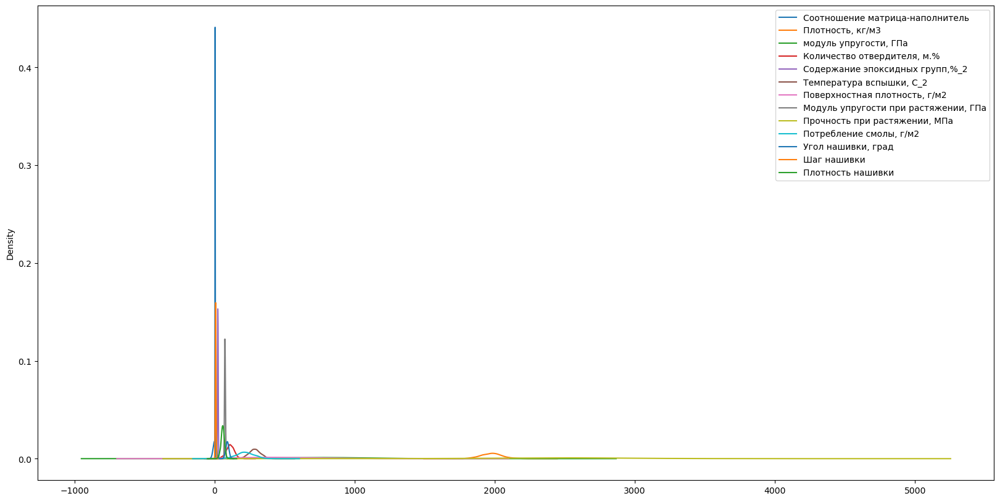

In [40]:
fig, ax = plt.subplots(figsize=(20, 10))
df.plot(kind='kde', ax=ax)

##### Создание испытательного набора

In [35]:
base = df.drop(index = [0,2,19,94,100,211,237,298,378,412,495,503,505,592,770,800,867,877,958])

In [52]:
minmax_scaler = MinMaxScaler()
columns = base.columns
base_minmax = minmax_scaler.fit_transform(np.array(base))
base_minmax = pd.DataFrame(base_minmax, columns=columns)
base_minmax.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.291465,0.646968,0.447061,0.196600,0.607435,0.463452,0.149682,0.319194,0.698235,0.522311,0.0,0.275109,0.523149
1,0.291465,0.646968,0.447061,0.678048,0.418887,0.527611,0.149682,0.319194,0.698235,0.522311,0.0,0.344539,0.382226
2,0.473005,0.646968,0.455721,0.573592,0.495653,0.463452,0.149682,0.319194,0.698235,0.522311,0.0,0.344539,0.490628
3,0.472327,0.581888,0.452685,0.573592,0.495653,0.463452,0.149682,0.319194,0.698235,0.522311,0.0,0.344539,0.523149
4,0.432949,0.386649,0.488508,0.573592,0.495653,0.463452,0.149682,0.319194,0.698235,0.522311,0.0,0.344539,0.631552


In [54]:
scaler = StandardScaler()
columns = base.columns
base_scaler = scaler.fit_transform(np.array(base))
base_scaler = pd.DataFrame(base_scaler, columns=columns)
base_scaler.head()


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.192930,0.754850,0.003463,-2.190524,0.633801,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-1.137647,0.224349
1,-1.192930,0.754850,0.003463,0.684811,-0.417195,0.346519,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,-0.838432
2,-0.176809,0.754850,0.047130,0.060972,0.010711,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,-0.020908
3,-0.180603,0.344428,0.031822,0.060972,0.010711,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,0.224349
4,-0.401011,-0.886839,0.212451,0.060972,0.010711,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,1.041873


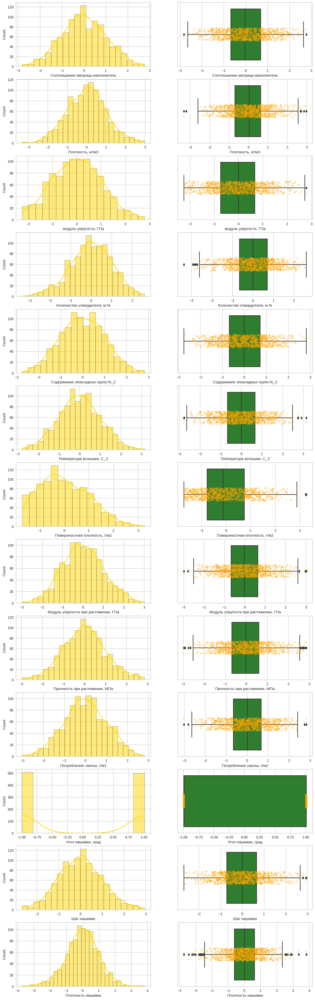

In [375]:
fig, axes = plt.subplots(13,2, figsize = (15,50))
for i, column in enumerate(base_scaler.columns):
    sns.histplot (data = base_scaler, x = column, kde = True, ax = axes [i,0], color ='gold')
    sns.boxplot(data = base_scaler, x = column, ax = axes [i,1], color = 'forestgreen')  
    sns.stripplot(x=column, data=base_scaler, ax = axes [i,1],marker="o", alpha=0.3, color="orange")
plt.show()

In [149]:
def predicted_plot(y_test, y_pred, model_name):
    plt.figure(figsize=(15,9))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(y_test, label='Тест')
    plt.plot(y_pred, label='Прогноз')
    plt.legend(loc='best')
    plt.ylabel('н')
    plt.xlabel('Порядок')

def predicted_ns(y_test, y_pred):
    plt.figure(figsize=(15,9))
    plt.title(f'Тест и прогноз, Соотношение М-Н: ')
    plt.plot(y_test.to_numpy(), label='Тест')
    plt.plot(y_pred, label='Прогноз')
    plt.legend(loc='best')
    plt.ylabel('н')
    plt.xlabel('Порядок')

In [183]:
base_scaler

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.192930,0.754850,0.003463,-2.190524,0.633801,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-1.137647,0.224349
1,-1.192930,0.754850,0.003463,0.684811,-0.417195,0.346519,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,-0.838432
2,-0.176809,0.754850,0.047130,0.060972,0.010711,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,-0.020908
3,-0.180603,0.344428,0.031822,0.060972,0.010711,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,0.224349
4,-0.401011,-0.886839,0.212451,0.060972,0.010711,-0.034576,-0.972007,-1.069604,1.101346,0.034047,-0.990089,-0.746245,1.041873
...,...,...,...,...,...,...,...,...,...,...,...,...,...
999,-0.732542,-0.311046,0.536529,-0.844133,-0.890879,0.960214,-0.974866,-0.072362,-0.167263,-1.586338,1.010010,0.849259,-0.836816
1000,0.570887,1.029685,-0.896632,1.302898,-1.110949,-0.787619,-0.470252,-0.127253,-0.222959,-1.710479,1.010010,1.432148,-0.286539
1001,0.389248,-0.033532,-0.982037,0.012691,0.721034,-0.931102,0.919080,0.457846,0.403394,0.317327,1.010010,-1.074571,0.848094
1002,0.861355,1.258298,0.011848,1.136055,-1.259275,-0.253443,0.567095,0.234702,-0.820664,-0.356138,1.010010,-0.232256,0.082188


###### Модуль упругости при растяжении, ГПа

In [241]:
X_1 = base_scaler.drop(['Модуль упругости при растяжении, ГПа'],axis = 1)
X_1 = np.array (X)

In [242]:
y_1 = base_scaler['Модуль упругости при растяжении, ГПа']
y_1 = np.array (y)

In [243]:
x_train, x_test, y_train,y_test = train_test_split (X_1,y_1, test_size=0.3, random_state = 42)

##### --- ElasticNetCV ----

##### Модуль упругости при растяжении

In [188]:
alphas = [0.0001,0.001, 0.01, 0.1, 0.3, 0.5, 0.7, 1]

Fitting 10 folds for each of 7 candidates, totalling 70 fits
R2:0.014, MSE:8.98, RMSE:3.00


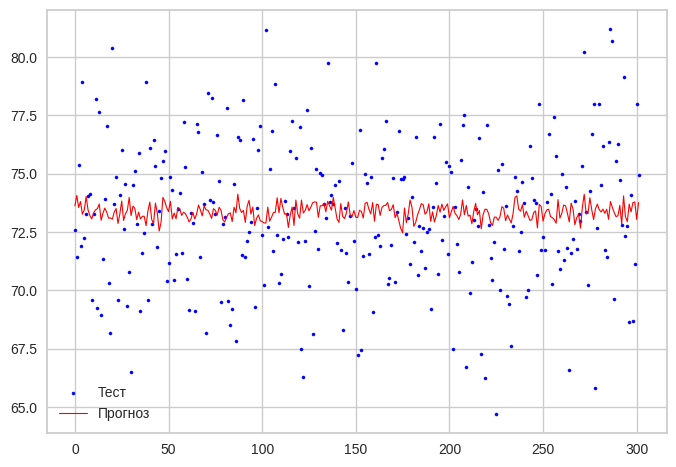

ElasticNetCV(alphas=[0.0001, 0.001, 0.01, 0.1, 0.3, 0.5, 0.7, 1], l1_ratio=0.1)


In [189]:
model = ElasticNetCV()
grid = { 'l1_ratio':[.1, .5, .7, .9, .95, .99, 1], 
        'alphas':[alphas]
          }
gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10,verbose = 1)
gsc.fit(x_train,  y_train)
model = gsc.best_estimator_
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

score = model.score(x_test, y_test)
mse = mean_squared_error(y_test, y_pred)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(x_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="Тест")
plt.plot(x_ax, y_pred, lw=0.8, color="red", label="Прогноз")
plt.legend()
plt.show()
results = gsc.best_estimator_ 
model_name = 'ElasticNetCV (GridSearchCV)'
print (results)

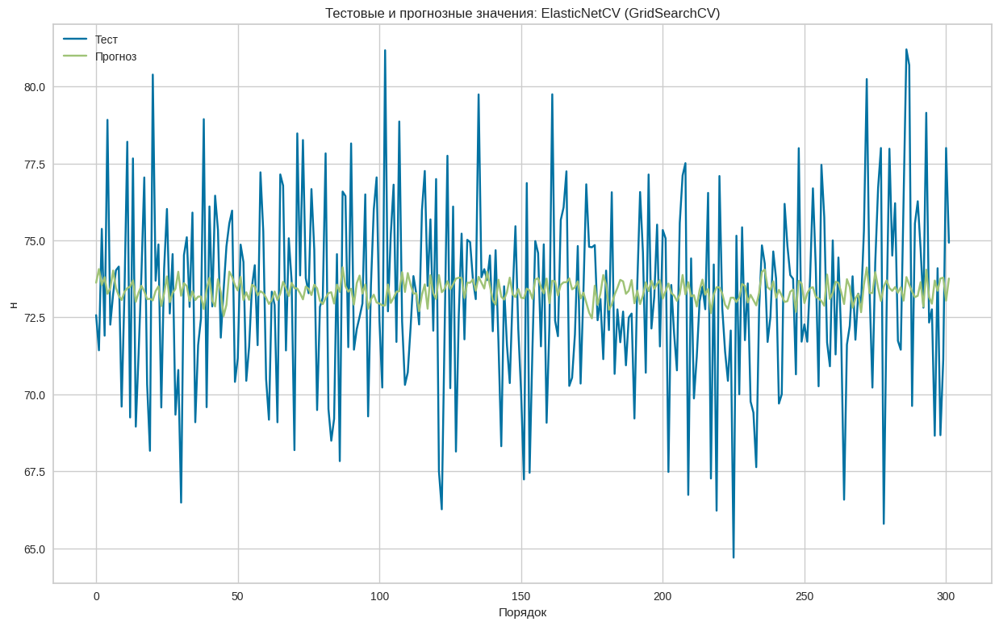

In [173]:
predicted_plot(y_test, y_pred, model_name)

In [174]:
gsc.best_estimator_

ElasticNetCV(alphas=[0.0001, 0.001, 0.01, 0.1, 0.3, 0.5, 0.7, 1], l1_ratio=0.1)

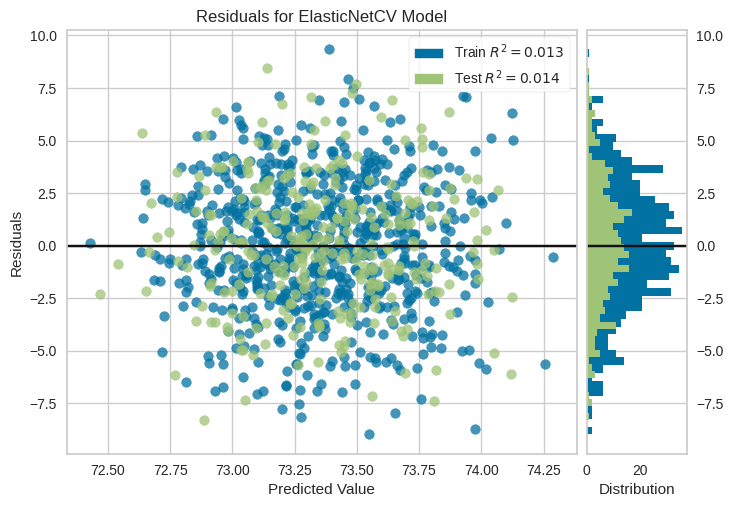

<AxesSubplot:title={'center':'Residuals for ElasticNetCV Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [175]:
visualizer = ResidualsPlot(model)

visualizer.fit(x_train, y_train)  
visualizer.score(x_test, y_test)  
visualizer.show()                 

###### KNeighborsRegressor

In [225]:
model = KNeighborsRegressor()
grid = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10,verbose = 1)
gsc.fit(x_train,  y_train)
model = gsc.best_estimator_
model.fit(x_train,  y_train)
y_pred = model.predict(x_test)
model_name = 'KNeighborsRegressor'


Fitting 10 folds for each of 800 candidates, totalling 8000 fits


R2:-0.026, MSE:9.35, RMSE:3.06


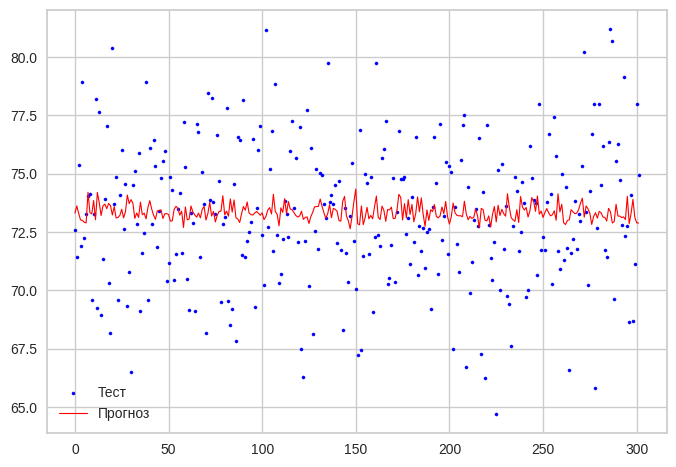

KNeighborsRegressor(n_neighbors=78)


In [228]:
score = model.score(x_test, y_test)
mse = mean_squared_error(y_test, y_pred)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(x_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="Тест")
plt.plot(x_ax, y_pred, lw=0.8, color="red", label="Прогноз")
plt.legend()
plt.show()
results = gsc.best_estimator_ 
model_name = 'KNeighborsRegressor'
print (results)

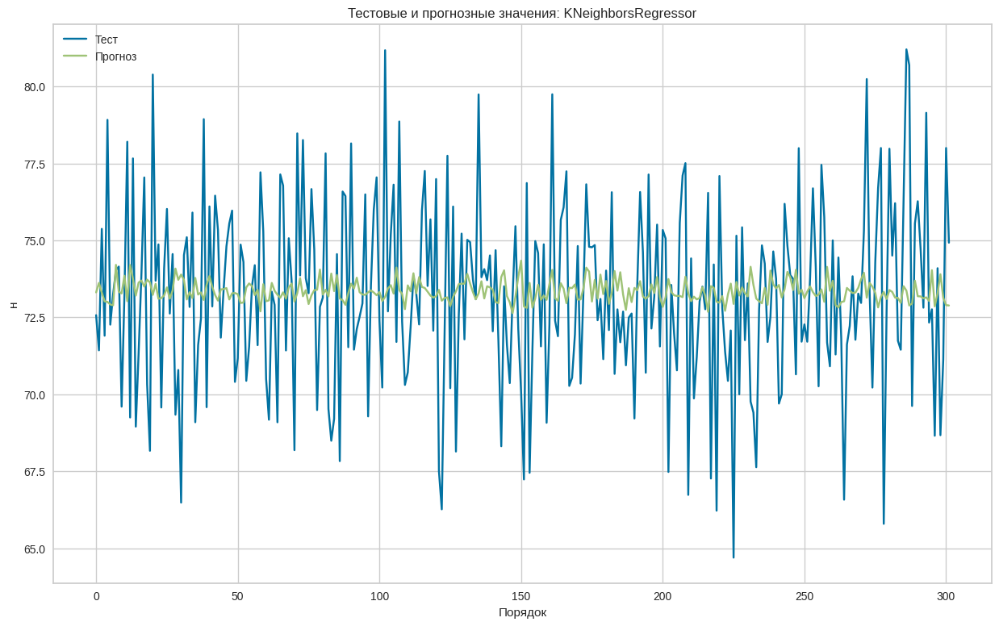

In [229]:
predicted_plot(y_test, y_pred, model_name)

In [232]:
model.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 78,
 'p': 2,
 'weights': 'uniform'}

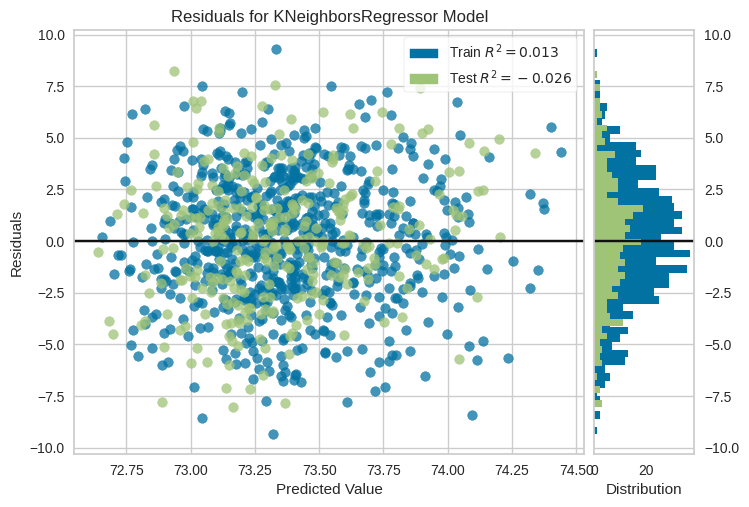

<AxesSubplot:title={'center':'Residuals for KNeighborsRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [233]:
visualizer = ResidualsPlot(model)

visualizer.fit(x_train, y_train)  
visualizer.score(x_test, y_test)  
visualizer.show()                 

###### Случайные леса

In [261]:
model = RandomForestRegressor()
grid = {'n_estimators' :[25,50,100] , 
          'max_leaf_nodes' : [10, 16,20],
               'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson']}

gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10,verbose = 1)
gsc.fit(x_train,  y_train)
model = gsc.best_estimator_
model.fit(x_train,  y_train)
y_pred = model.predict(x_test)
model_name = 'RandomForestRegressor'


Fitting 10 folds for each of 36 candidates, totalling 360 fits


R2:-0.029, MSE:9.37, RMSE:3.06


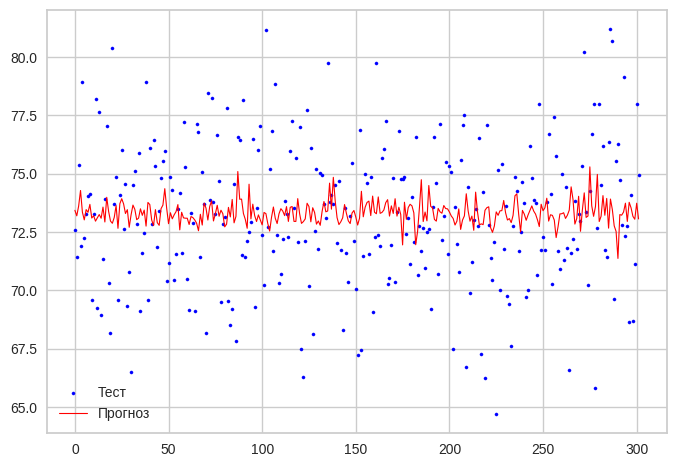

RandomForestRegressor(max_leaf_nodes=10, n_estimators=25)


In [262]:
score = model.score(x_test, y_test)
mse = mean_squared_error(y_test, y_pred)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(x_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="Тест")
plt.plot(x_ax, y_pred, lw=0.8, color="red", label="Прогноз")
plt.legend()
plt.show()
results = gsc.best_estimator_ 
print (results)

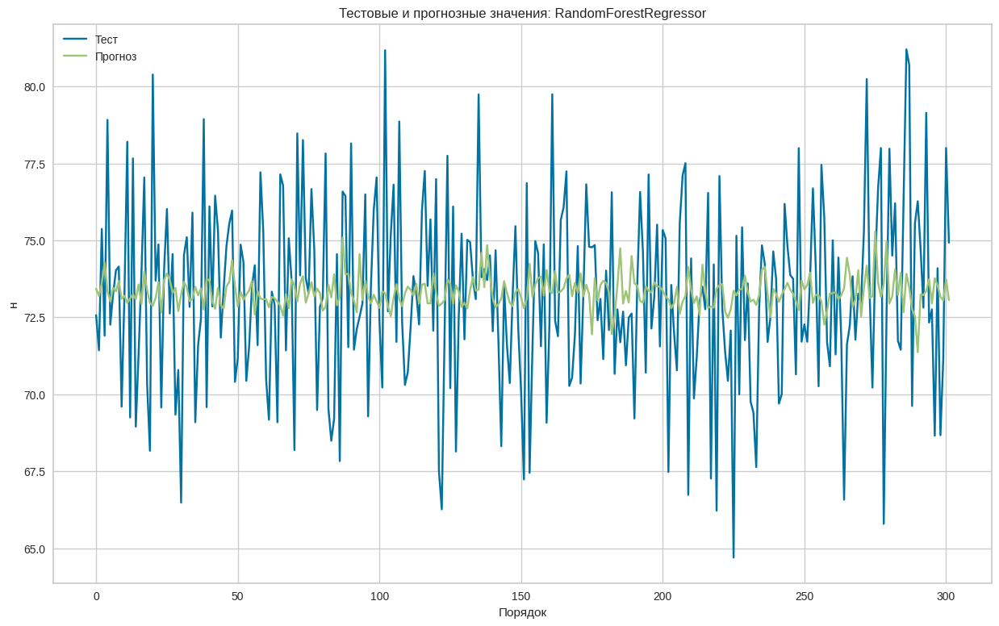

In [263]:
predicted_plot(y_test, y_pred, model_name)

In [264]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': 10,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 25,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

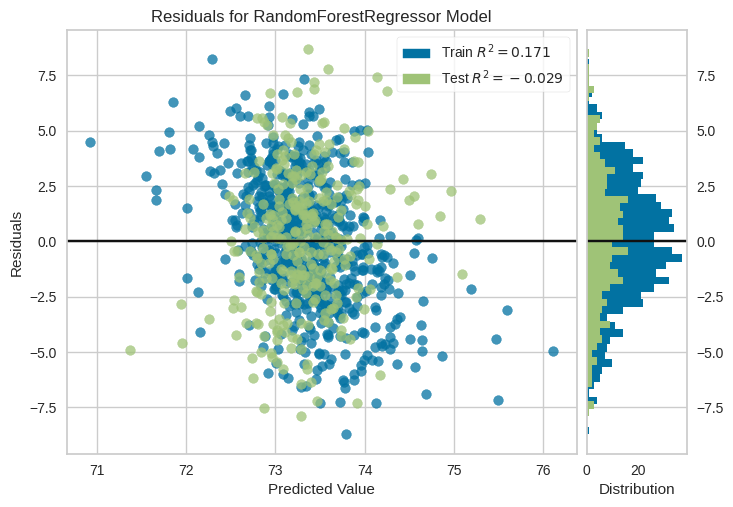

<AxesSubplot:title={'center':'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [265]:
visualizer = ResidualsPlot(model)

visualizer.fit(x_train, y_train)  
visualizer.score(x_test, y_test)  
visualizer.show()  

##### Плотность при растяжении

In [250]:
X_2 = base_scaler.drop(['Прочность при растяжении, МПа'],axis = 1)
y_2 = base_scaler['Прочность при растяжении, МПа']
y_2 = np.array (y)
X_2 = np.array (X)
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.3,random_state=42)

Fitting 10 folds for each of 7 candidates, totalling 70 fits
R2:0.014, MSE:8.98, RMSE:3.00


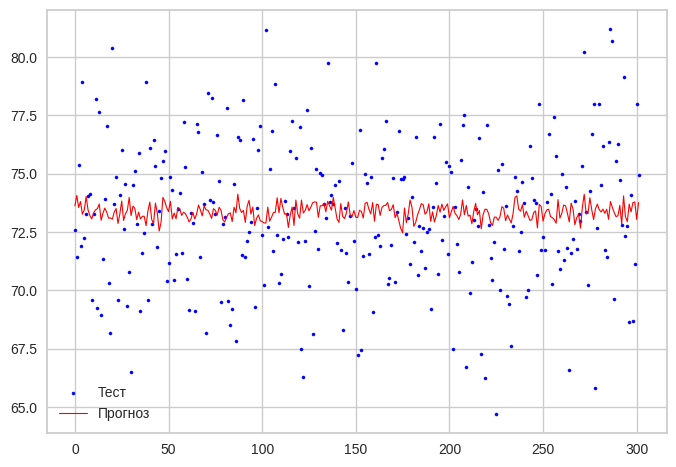

ElasticNetCV(alphas=[0.0001, 0.001, 0.01, 0.1, 0.3, 0.5, 0.7, 1], l1_ratio=0.1)


In [197]:
model = ElasticNetCV()
grid_2 = { 'l1_ratio':[.1, .5, .7, .9, .95, .99, 1], 
        'alphas':[alphas]
          }
gsc_2 = GridSearchCV(model, grid_2, n_jobs=-1, cv=10,verbose = 1)
gsc_2.fit(x_train_2,  y_train_2)
model = gsc_2.best_estimator_
model.fit(x_train_2, y_train_2)
y_pred_2 = model.predict(x_test_2)

score = model.score(x_test_2, y_test_2)
mse = mean_squared_error(y_test_2, y_pred_2)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(x_test_2))
plt.scatter(x_ax, y_test_2, s=5, color="blue", label="Тест")
plt.plot(x_ax, y_pred_2, lw=0.8, color="red", label="Прогноз")
plt.legend()
plt.show()
results = gsc_2.best_estimator_ 
model_name = 'ElasticNetCV (GridSearchCV)'
print (results)

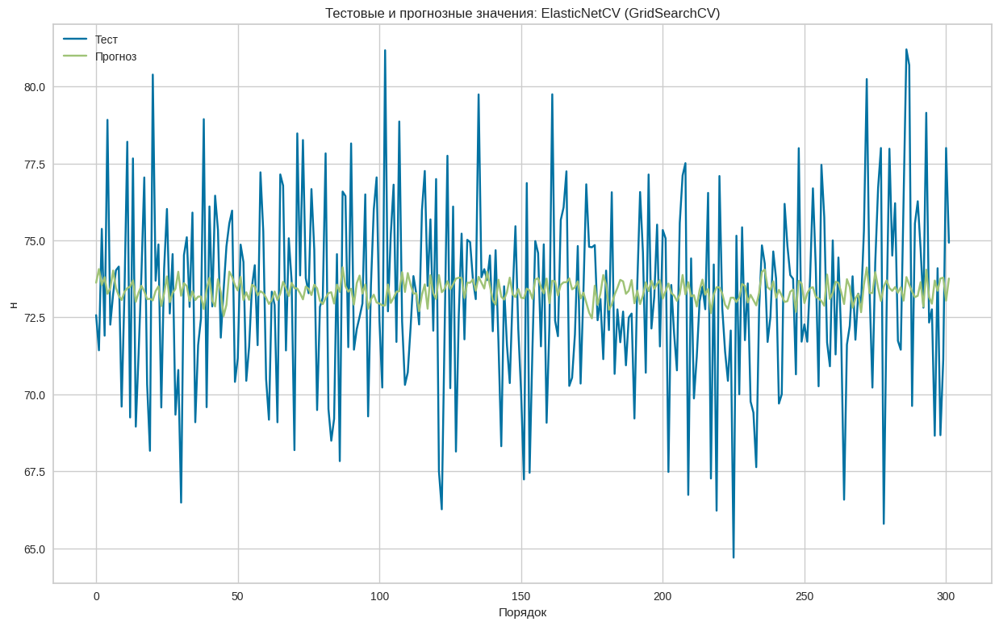

In [198]:
predicted_plot(y_test_2, y_pred_2, model_name)

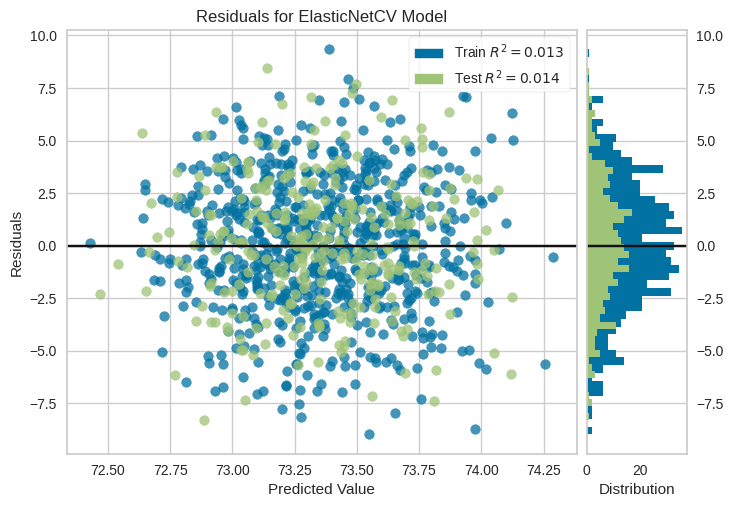

<AxesSubplot:title={'center':'Residuals for ElasticNetCV Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [193]:
visualizer = ResidualsPlot(model)

visualizer.fit(x_train_2, y_train_2)  
visualizer.score(x_test_2, y_test_2)  
visualizer.show()                 

###### KNeighborsRegressor

In [236]:
model = KNeighborsRegressor()
grid = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10,verbose = 1)
gsc.fit(x_train_2,  y_train_2)
model = gsc.best_estimator_
model.fit(x_train_2,  y_train_2)
y_pred_2 = model.predict(x_test_2)
model_name = 'KNeighborsRegressor'

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


R2:-0.026, MSE:9.35, RMSE:3.06


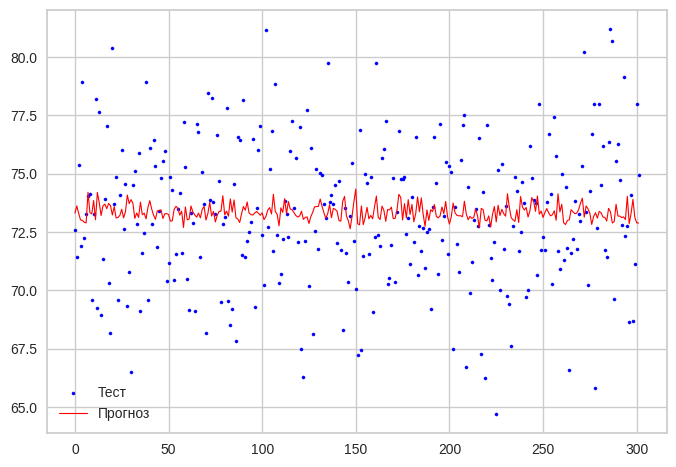

KNeighborsRegressor(n_neighbors=78)


In [237]:
score = model.score(x_test_2, y_test_2)
mse = mean_squared_error(y_test_2, y_pred_2)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(x_test_2))
plt.scatter(x_ax, y_test_2, s=5, color="blue", label="Тест")
plt.plot(x_ax, y_pred_2, lw=0.8, color="red", label="Прогноз")
plt.legend()
plt.show()
results = gsc.best_estimator_ 
model_name = 'KNeighborsRegressor'
print (results)

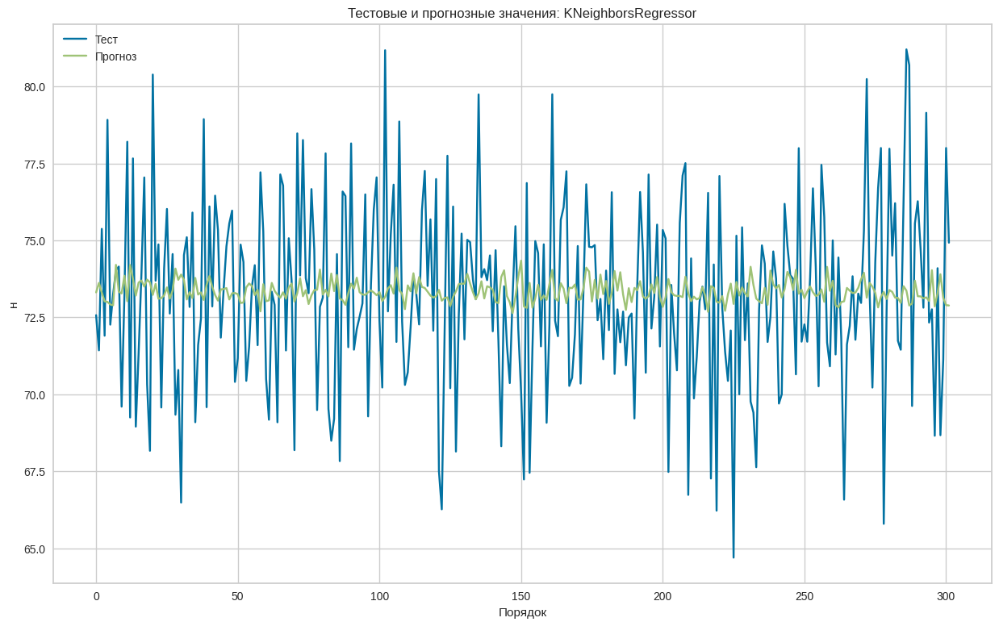

In [238]:
predicted_plot(y_test_2, y_pred_2, model_name)

In [239]:
model.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 78,
 'p': 2,
 'weights': 'uniform'}

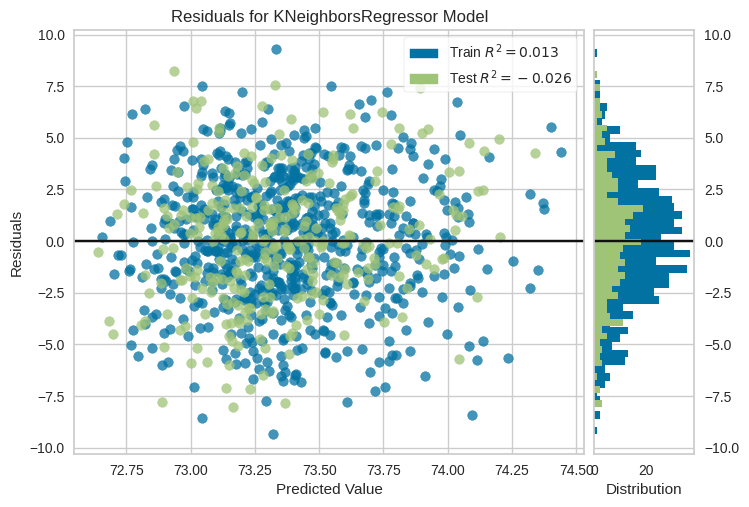

<AxesSubplot:title={'center':'Residuals for KNeighborsRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [240]:
visualizer = ResidualsPlot(model)

visualizer.fit(x_train, y_train)  
visualizer.score(x_test, y_test)  
visualizer.show() 

###### Случайные леса

In [256]:
model = RandomForestRegressor()
grid = {'n_estimators' :[25,50,100] , 
          'max_leaf_nodes' : [10, 16,20],
            'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson']  }

gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10,verbose = 1)
gsc.fit(x_train_2,  y_train_2)
model = gsc.best_estimator_
model.fit(x_train_2,  y_train_2)
y_pred_2 = model.predict(x_test_2)
model_name = 'RandomForestRegressor'


Fitting 10 folds for each of 36 candidates, totalling 360 fits


R2:-0.036, MSE:9.44, RMSE:3.07


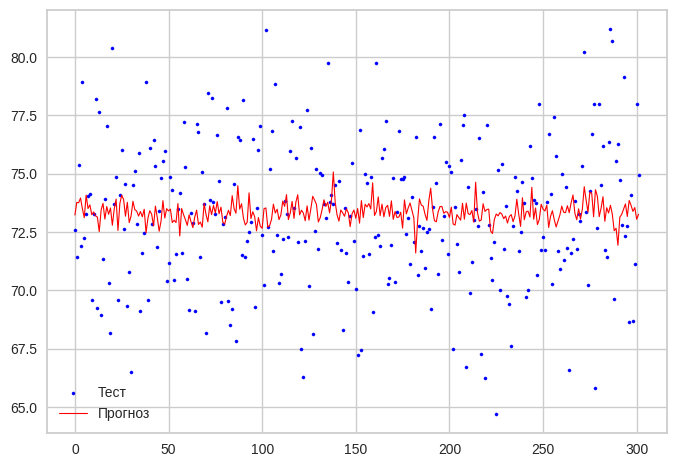

RandomForestRegressor(max_leaf_nodes=10, n_estimators=50)


In [257]:
score = model.score(x_test_2, y_test_2)
mse = mean_squared_error(y_test_2, y_pred_2)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(x_test_2))
plt.scatter(x_ax, y_test_2, s=5, color="blue", label="Тест")
plt.plot(x_ax, y_pred_2, lw=0.8, color="red", label="Прогноз")
plt.legend()
plt.show()
results = gsc.best_estimator_ 
print (results)

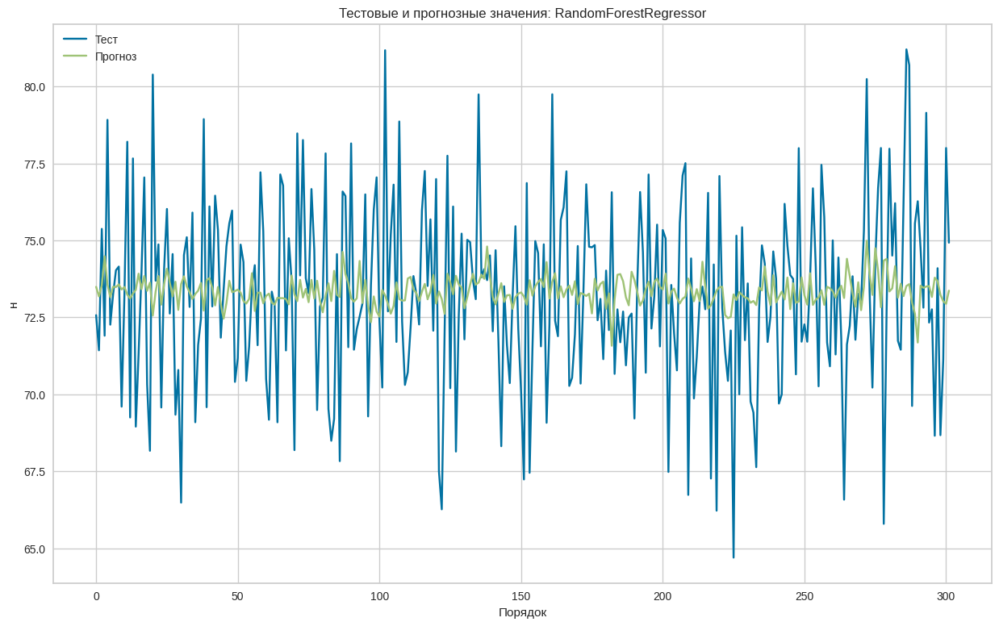

In [258]:
predicted_plot(y_test, y_pred, model_name)

In [259]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': 10,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 50,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

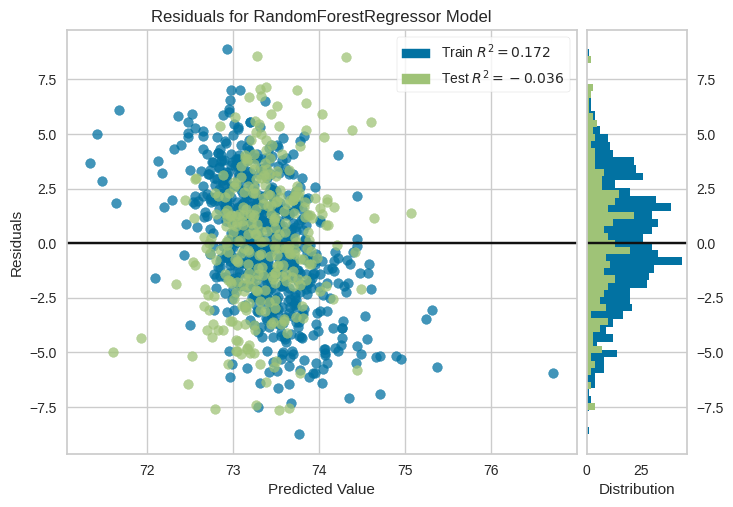

<AxesSubplot:title={'center':'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [260]:
visualizer = ResidualsPlot(model)

visualizer.fit(x_train, y_train)  
visualizer.score(x_test, y_test)  
visualizer.show()  

##### Нейронная сеть

In [284]:
base_1 = pd.read_excel('/home/iana/Desktop/Data scientice/ВКР/X_bp.xlsx')
base_2 = pd.read_excel('/home/iana/Desktop/Data scientice/ВКР/X_nup.xlsx')

In [285]:
base = pd.merge(base_1, base_2, left_index=True, right_index=True, how = 'inner')
base = base.drop(['Unnamed: 0_y','Unnamed: 0_x'],axis = 1)

In [332]:
base = df.drop(index = [0,2,19,94,100,211,237,298,378,412,495,503,505,592,770,800,867,877,958])

In [334]:
base.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [335]:
X = base.drop(['Соотношение матрица-наполнитель'],axis = 1)
y = base['Соотношение матрица-наполнитель']
y = np.array (y)
X = np.array (X)
xtrain_full, xtest, ytrain_full, ytest = train_test_split(X, y, test_size=0.3)
xtrain, xvalid, ytrain, yvalid = train_test_split (xtrain_full,ytrain_full)

In [336]:
scaler = StandardScaler()

In [337]:
xtrain = scaler.fit_transform(xtrain)
xvalid = scaler.transform(xvalid)
xtest = scaler.transform(xtest)

In [338]:
model = keras.models.Sequential([
    keras.layers.Dense (30, activation = 'relu',
                       input_shape = xtrain.shape[1:]),
    keras.layers.Dense(1)
])
model.compile (loss = 'huber', optimizer = 'sgd')
history = model.fit(xtrain, ytrain, epochs = 30,
                   validation_data = (xvalid, yvalid))
mse_test = model.evaluate (xtest,ytest)
x_new = xtest[:3]
ypred = model.predict (x_new)

Epoch 1/30
17/17 [==============================] - 0s 8ms/step - loss: 2.1514 - val_loss: 1.5734
Epoch 2/30
17/17 [==============================] - 0s 3ms/step - loss: 1.4951 - val_loss: 1.0720
Epoch 3/30
17/17 [==============================] - 0s 3ms/step - loss: 1.0256 - val_loss: 0.7873
Epoch 4/30
17/17 [==============================] - 0s 3ms/step - loss: 0.7536 - val_loss: 0.6651
Epoch 5/30
17/17 [==============================] - 0s 3ms/step - loss: 0.6194 - val_loss: 0.6152
Epoch 6/30
17/17 [==============================] - 0s 4ms/step - loss: 0.5509 - val_loss: 0.5931
Epoch 7/30
17/17 [==============================] - 0s 3ms/step - loss: 0.5137 - val_loss: 0.5789
Epoch 8/30
17/17 [==============================] - 0s 4ms/step - loss: 0.4910 - val_loss: 0.5671
Epoch 9/30
17/17 [==============================] - 0s 3ms/step - loss: 0.4747 - val_loss: 0.5564
Epoch 10/30
17/17 [==============================] - 0s 3ms/step - loss: 0.4619 - val_loss: 0.5469
Epoch 11/30
17/17 [

In [358]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 30)                390       
                                                                 
 dense_7 (Dense)             (None, 1)                 31        
                                                                 
Total params: 421
Trainable params: 421
Non-trainable params: 0
_________________________________________________________________


In [353]:
MSE = mean_squared_error(ytest, model.predict(xtest))
R2 = r2_score(ytest, model.predict(xtest))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

4/4 [==============================] - 0s 784us/step
MSE NN = 0.8878152416362058
R2_score NN = -0.08989190355450383


In [354]:
model.evaluate(xtest, ytest, verbose=1)

4/4 [==============================] - 0s 1ms/step - loss: 0.3982


0.3981688320636749

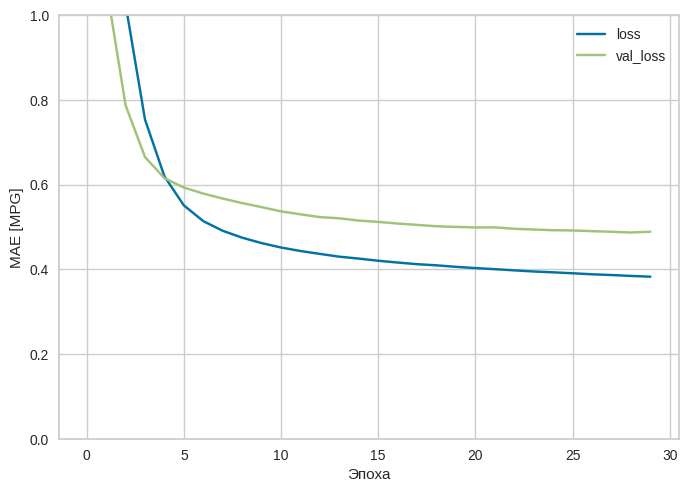

In [355]:
plot_loss(history)

In [356]:
model_name = 'Нейронная сеть'

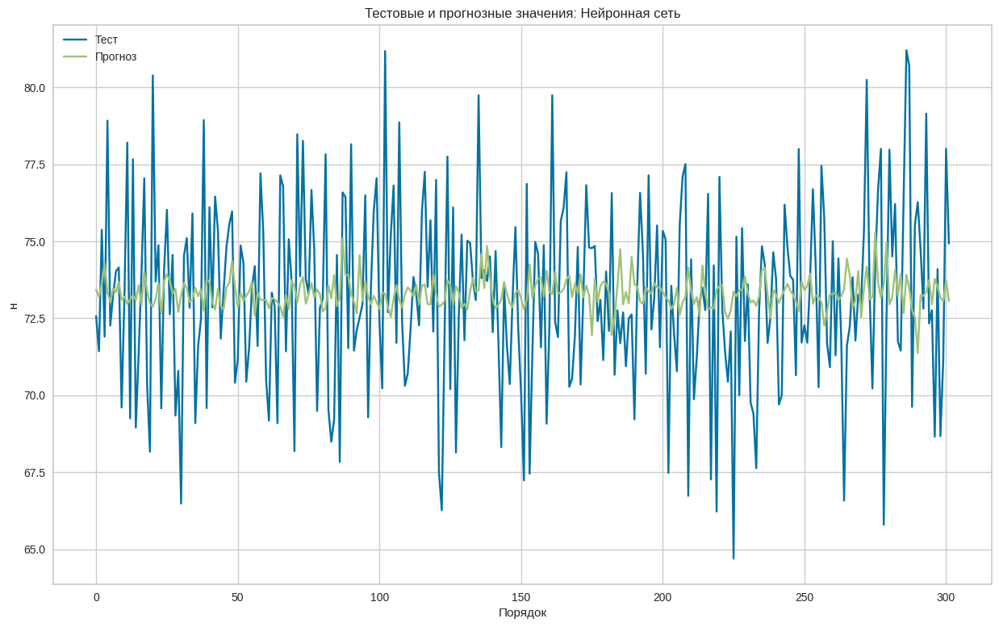

In [357]:
predicted_plot(y_test, y_pred, model_name)

In [339]:
model.save('my_keras_model.h5')

In [359]:
joblib.dump(model,'my_model.pkl')

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
...metrics
......mean
.........vars
............0
............1
...optimizer
......vars
.........0
.........1
.........2
.........3
.........4
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-03-30 18:58:23         1382
metadata.json                                  2023-03-30 18:58:23           64
variables.h5                                   2023-03-30 18:58:23        19240


['my_model.pkl']

In [360]:
joblib.dump(model,'my_model_1.joblib')

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
...metrics
......mean
.........vars
............0
............1
...optimizer
......vars
.........0
.........1
.........2
.........3
.........4
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-03-30 18:58:26         1382
metadata.json                                  2023-03-30 18:58:26           64
variables.h5                                   2023-03-30 18:58:26        19240


['my_model_1.joblib']

In [361]:
model_l = load('my_model_1.joblib') 

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-03-30 18:58:26         1382
metadata.json                                  2023-03-30 18:58:26           64
variables.h5                                   2023-03-30 18:58:26        19240
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
...metrics
......mean
.........vars
............0
............1
...optimizer
......vars
.........0
.........1
.........2
.........3
.........4
...vars


In [362]:
ypred = model.predict(xtest)

4/4 [==============================] - 0s 797us/step


In [363]:
xtest = scaler.transform(X[:100])

In [364]:
ytest = y[:100]

In [365]:
ypred = model.predict (xtest)

4/4 [==============================] - 0s 871us/step


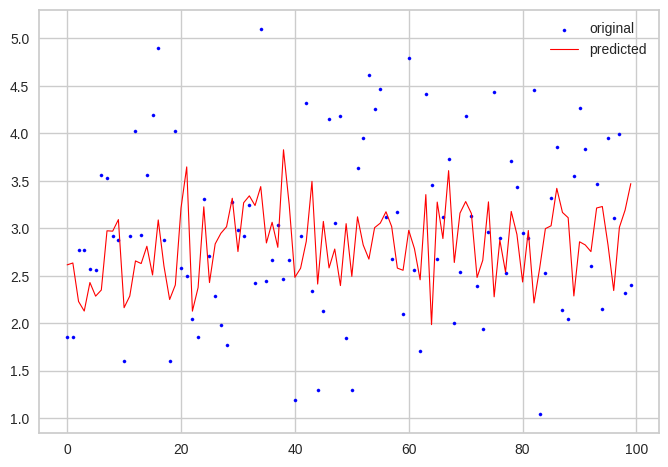

In [366]:
x_ax = range(len(xtest))
plt.scatter(x_ax, ytest, s=5, color="blue", label="original")
plt.plot(x_ax, ypred, lw=0.8, color="red", label="predicted")
plt.legend()
plt.show()

In [295]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 1])
    plt.xlabel('Эпоха')

    plt.ylabel('MAE [MPG]')
    plt.legend()
    plt.grid(True)

In [352]:
base.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [374]:
from joblib import dump, load
def input_variable():
    
    x1 = float(input('Введите значение переменной Плотность: '))
    x2 = float(input('Введите значение переменной Модуль упругости: '))
    x3 = float(input('Введите значение переменной Количество отвердителя: '))
    x4 = float(input('Введите значение переменной Содержание эпоксидных групп: '))
    x5 = float(input('Введите значение переменной Температура вспышки: '))
    x6 = float(input('Введите значение переменной Поверхностная плотность: '))
    x7 = float(input('Введите значение переменной Модуль упругости при растяжении: '))
    x8 = float(input('Введите значение переменной Прочность при растяжении: '))
    x9 = float(input('Введите значение переменной Потребление смолы: '))
    x10 = float(input('Введите значение переменной Угол нашивки: '))
    x11 = float(input('Введите значение переменной Шаг нашивки: '))
    x12 = float(input('Введите значение переменной Плотность нашивки: '))
   
    return x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12

def input_proc(X):
    print('вызов модели')
    res = model_l.predict(X)
    return res 

def app_model():
    model_l = load('my_model_1.joblib')
    for i in range(110):
        try:
            print('введите 1 для прогноза, 2 для выхода')
            check = input()
            
            if check == '1':
                print('Введите данные')
                X = input_variable()
                X = np.array(X).reshape(1,-1)
                print(['Cоотношения матрица-наполнитель'])
                print(input_proc(X))


            elif check == '2':
                break
            else:
                print('Повторите выбор')
        except Exeption as e:
            print('Неверные данные. Повторите операцию')
            print(e)
app_model()

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-03-30 18:58:26         1382
metadata.json                                  2023-03-30 18:58:26           64
variables.h5                                   2023-03-30 18:58:26        19240
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
...metrics
......mean
.........vars
............0
............1
...optimizer
......vars
.........0
.........1
.........2
.........3
.........4
...vars
введите 1 для прогноза, 2 для выхода
1
Введите данные
Введите значение переменной Плотность: 1
Введите значение переменной Модуль упругости: 1
Введите значение переменной Количество отвердителя: 1
Введите значение переменной Содержание эпоксидных групп: 1
Введите значение переменной Температура вспышки: 1
Введите

1# 